# Montecarlo Approximation of Electron-Matter-Interaction

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import sys
from fastai.vision.all import * 
import fastai
import torch
print("sys.version", sys.version)
print("cuda device name(0)", torch.cuda.get_device_name(0))
print("torch.__version__", torch.__version__)
print("fastai.__version__", fastai.__version__)

sys.version 3.9.7 (default, Sep 16 2021, 13:09:58) 
[GCC 7.5.0]
cuda device name(0) Tesla V100S-PCIE-32GB
torch.__version__ 1.7.1
fastai.__version__ 2.7.4


In [3]:
import pathlib
input_path = Path('./data')

def get_x(input_path):
    file_names = get_image_files(input_path)
    file_names = [filename for filename in file_names if "_hf.png" in str( filename ) ]
    return file_names
    
file_names = get_x(input_path)    
print(file_names[0:5])

[Path('data/CoxSpheres_Small_01_230_hf.png'), Path('data/Fibers_01mus_01_140_hf.png'), Path('data/NonOverlappingBalls_01_255_hf.png'), Path('data/NonOverlappingBalls_01_465_hf.png'), Path('data/CoxSpheres_Large_01_20_hf.png')]


## Datensatz laden

In [4]:
def label_function(filename):
    filename_parts = str(filename.stem).split("_")
    y = input_path / Path( "_".join(filename_parts[:-1]) + "_bse.png" )
    return str(y)

for i in range(5):
    print(file_names[i], "=>", label_function(file_names[i]))

data/CoxSpheres_Small_01_230_hf.png => data/CoxSpheres_Small_01_230_bse.png
data/Fibers_01mus_01_140_hf.png => data/Fibers_01mus_01_140_bse.png
data/NonOverlappingBalls_01_255_hf.png => data/NonOverlappingBalls_01_255_bse.png
data/NonOverlappingBalls_01_465_hf.png => data/NonOverlappingBalls_01_465_bse.png
data/CoxSpheres_Large_01_20_hf.png => data/CoxSpheres_Large_01_20_bse.png


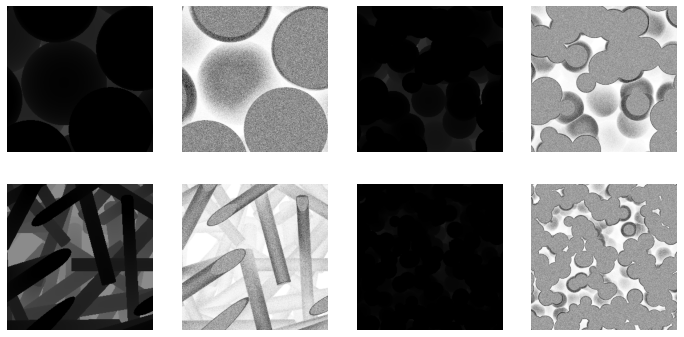

In [5]:
item_transforms  = [RandomCrop((256,256))]

datablocks = DataBlock(blocks=(ImageBlock, ImageBlock(cls=PILImageBW)),
                       get_items = get_x,
                       get_y = label_function,
                       splitter=RandomSplitter(valid_pct=0.2, seed=42),
                       item_tfms=item_transforms)

data_loader = datablocks.dataloaders(input_path, bs=4, num_workers=0 )

data_loader.show_batch( max_n=4 )

# Netzwerk Architektur

In [6]:
def create_model( dataloader, backbone, **kwargs ):
    img_size = dataloader.one_batch()[0].shape[-2:]
    model = create_unet_model(backbone, 1, img_size, **kwargs)
    return model

## Determine Learning Rate

In [7]:
# learner.save("custom_initial")
# learner.lr_find()

In [8]:
learning_rate=0.001

## Training 

resnet101


epoch,train_loss,valid_loss,time
0,0.151171,0.117620,00:44
1,0.110481,0.085587,00:44
2,0.095840,0.084384,00:44
3,0.087678,0.084493,00:44
4,0.093717,0.115819,00:44
5,0.094071,0.078631,00:44
6,0.085318,0.069265,00:44
7,0.083074,0.069337,00:44
8,0.078609,0.073208,00:44
9,0.076058,0.085890,00:44


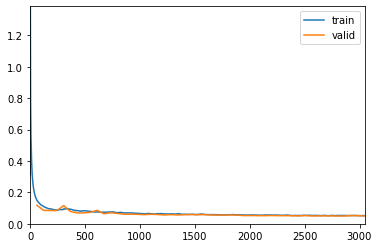

[0.05241059511899948, 0.05004722625017166]


In [9]:
from torchvision.models import *

train = True

# for backbone, backbone_name in [ (resnet101, "resnet101"), (resnet34,"resnet34"), (resnet50,"resnet50") ]:
for backbone, backbone_name in [ (resnet101, "resnet101") ]:
    print(backbone_name)
    model = create_model( data_loader, backbone )
    learner = Learner( data_loader, model, loss_func=L1LossFlat() )
    if train:
        learner.fit_one_cycle( 50, lr_max=learning_rate, cbs=[ShowGraphCallback()] )    
        learner.save(backbone_name + "50")
    else:
        learner.load(backbone_name + "50")
        
    # learner.fit_one_cycle( 50, lr_max=learning_rate, cbs=[ShowGraphCallback()] )    
    # leaner.save(backbone_name + "100")
    # learner.fit_one_cycle( 100, lr_max=learning_rate, cbs=[ShowGraphCallback()] )    
    # leaner.save(backbone_name + "200")
    print( learner.recorder.final_record )

In [10]:
import matplotlib as mp
cpts = [0.0, 127.0/255.0, 1.0]
colors = [(cpts[0], (0, 0, 1.0)), (cpts[1], (0, 1.0, 0.0)), (cpts[2], (1.0, 0, 0))]
cmap_name = 'my_list'
colormap = mp.colors.LinearSegmentedColormap.from_list(cmap_name, colors)

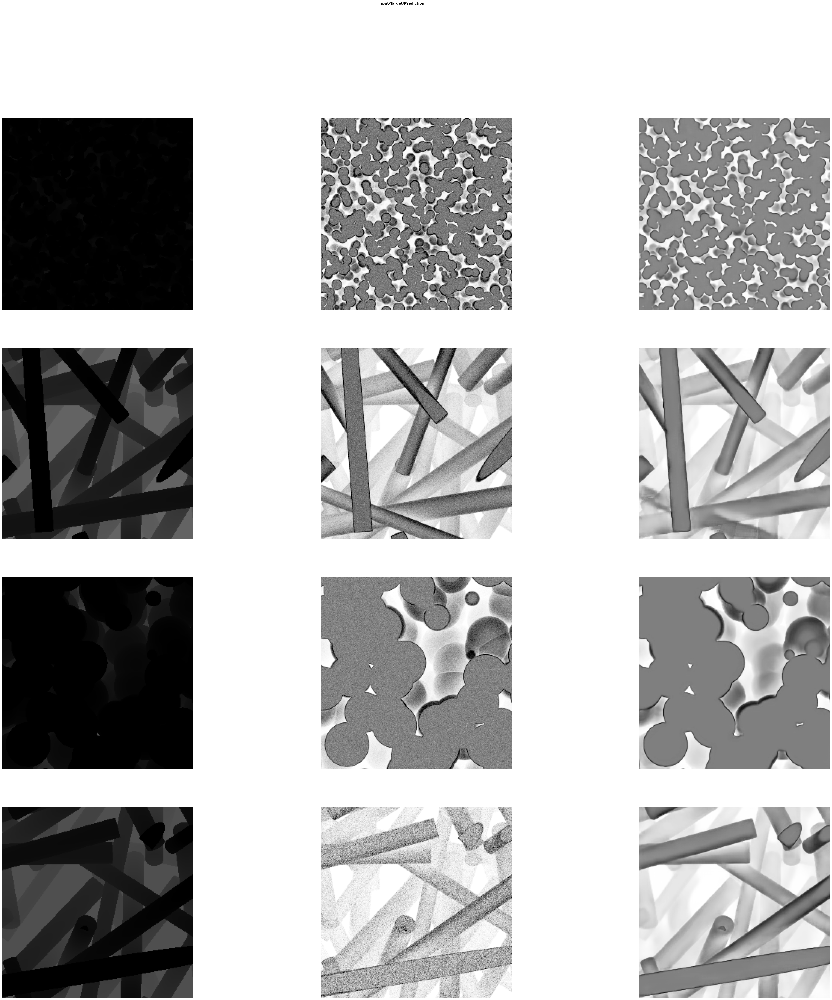

In [11]:
learner.show_results( figsize=(64,64), vmin=0, vmax=196 )

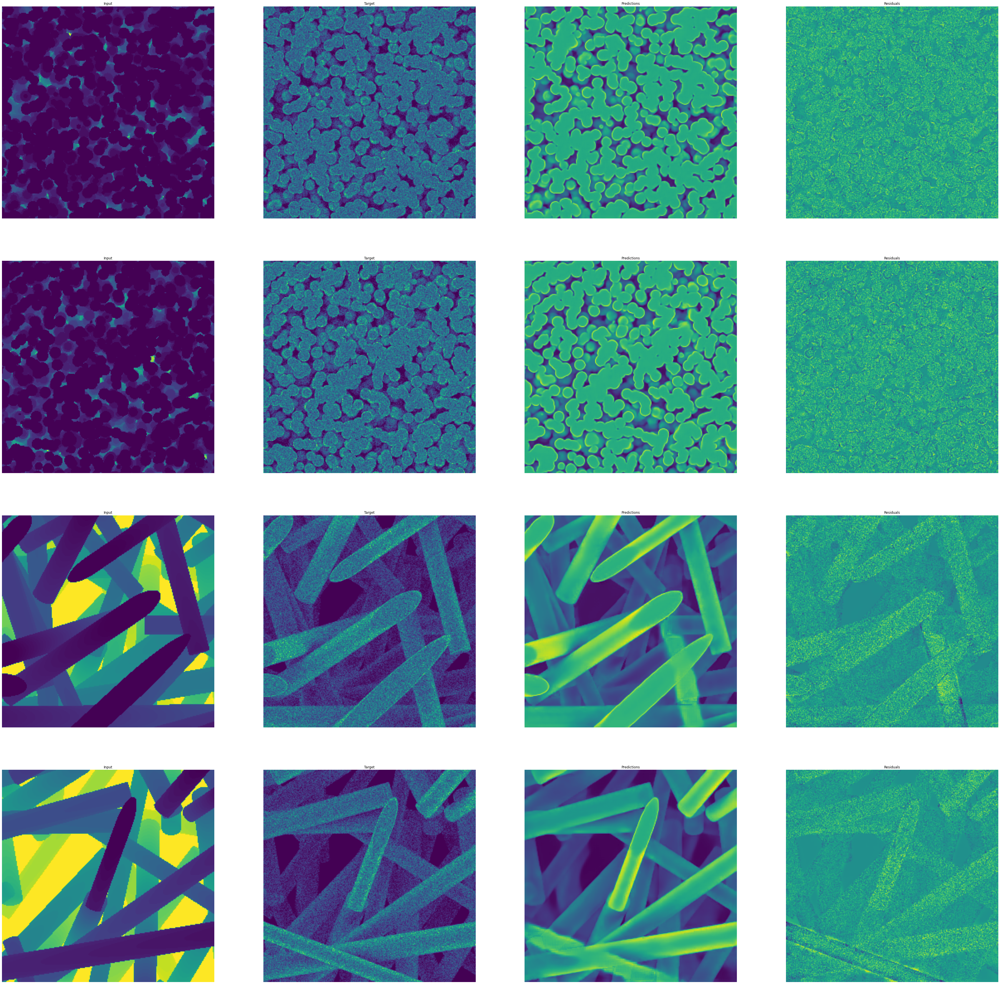

In [37]:
from torchvision.utils import save_image

interpretation = Interpretation.from_learner( learner )
values,indices = interpretation.top_losses(k=4)

fig, axs = plt.subplots(4, 4, figsize=(64,64))

for i,idx in enumerate(indices):
    inps, preds, targs, decoded, loss = interpretation[idx]
    inps = inps[0,0,:,:]
    targs = targs[0,:,:,:]
    preds = preds[0,:,:,:]
    resid = preds - targs
    show_image( ax=axs[i,0], im=inps, title="Input")
    show_image( ax=axs[i,1], im=targs, title="Target")
    show_image( ax=axs[i,2], im=preds, title="Predictions")
    show_image( ax=axs[i,3], im=resid, title="Residuals")
    # save_image(inps, "input_" + str(i) + ".png")
    # save_image(preds, "prediction_" + str(i) + ".png")
    # save_image(targs, "target_" + str(i) + ".png")
    # save_image(decoded, "decoded_" + str(i) + ".png")
# interpretation.show_results( indices, figsize=(64,64), vmin=0, vmax=128 )